In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Question 1: Image Segmentation and Detection

In [8]:
parent_dir = 'skin lesion dataset'
org_images_dir = 'org data'
segmentations_dir = 'GT'

In [9]:
org_images_addrs = os.listdir(os.path.join(parent_dir,org_images_dir))

In [108]:
data = []
for addr in org_images_addrs:
    img_name = addr.split('.')[0]
    img = cv2.imread(os.path.join(parent_dir,org_images_dir,addr))
    rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    gimg = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # org_images.append(img)
    segmentation = cv2.imread(os.path.join(parent_dir,segmentations_dir,img_name+f"_Segmentation.png"),0)
    data.append([rgb_img,gimg,segmentation,img_name])
    
    
    # org_images.append(img)
    # segmented_images.append(segmentation)
    


## Task 1: Object segmentation. For each skin lesion image

In [96]:
import math
def findDistance(p1,p2):
    x1,y1 = p1
    x2,y2 = p2
    return math.sqrt((x2-x1)**2+(y2-y1)**2)

In [104]:
def detectLesionRegion(gimg):
    # Blur the image to remove noise from image, if it has any
    blur = cv2.GaussianBlur(gimg,(5,5),0)
    # Apply OSTU Threshold to get darker areas from the image
    ret,thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    
    # Erosion to remove hairs or unwanted lines
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
    mask = cv2.morphologyEx(thresh,cv2.MORPH_ERODE,kernel,iterations=3)
    
    # Get the biggest object from the image that most probably would be our target area
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask,4)
    # max_label, max_size = max([(i, stats[i, cv2.CC_STAT_AREA]) for i in range(1, num_labels)], key=lambda x: x[1])
    
    h,w = labels.shape
    center = (int(w/2),int(h/2))
    areas = []
    for i in range(1,num_labels):
        label_area = stats[i,cv2.CC_STAT_AREA]
        distance = findDistance(center,centroids[i])
        if distance > 230:
            label_area = 0
        areas.append([i,label_area])
    max_label, max_size = max(areas,key=lambda x: x[1])
    detectedArea = np.zeros_like(thresh)
    detectedArea[labels == max_label] = 255
    
    #  Fill holes in the area
    contours, hierarchy = cv2.findContours(detectedArea, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    len_contour = len (contours)
    contour_list = []
    for i in range(len_contour):
        drawing = np.zeros_like(detectedArea, np.uint8)  # create a black image
        img_contour = cv2.drawContours(drawing, contours, i, (255, 255, 255), -1)
        contour_list.append(img_contour)
    out = sum(contour_list)
    # kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT,(7,7))
    # mask2 = cv2.morphologyEx(detectedArea,cv2.MORPH_CLOSE,kernel2,iterations=3)
    return out
    

/tmp/ipykernel_248906/3631269623.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


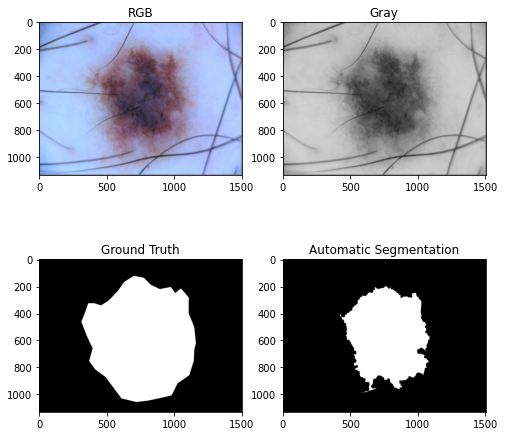

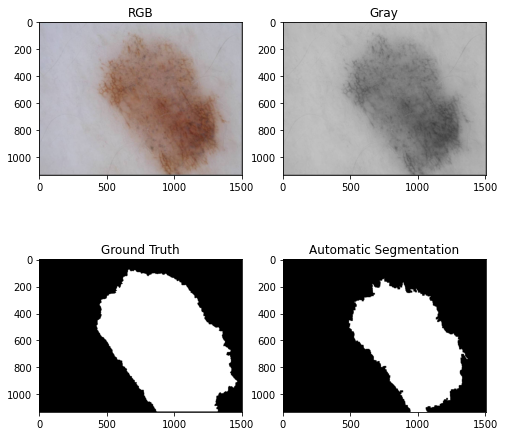

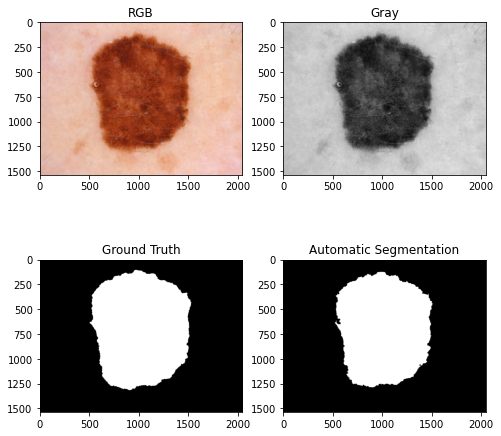

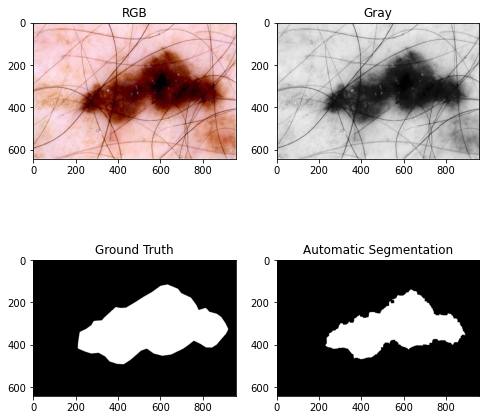

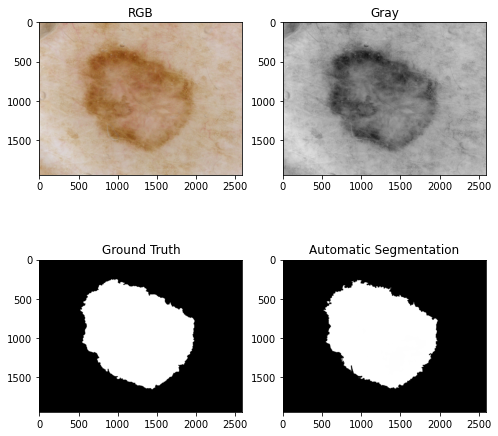

...

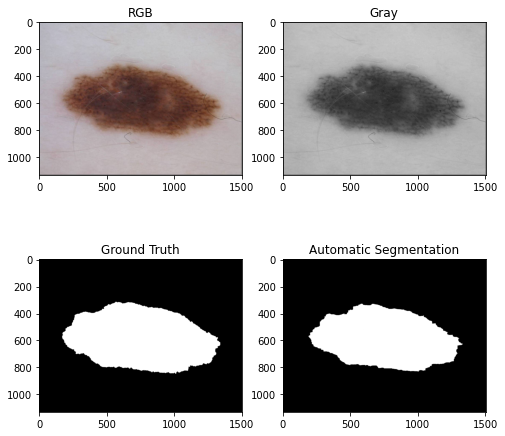

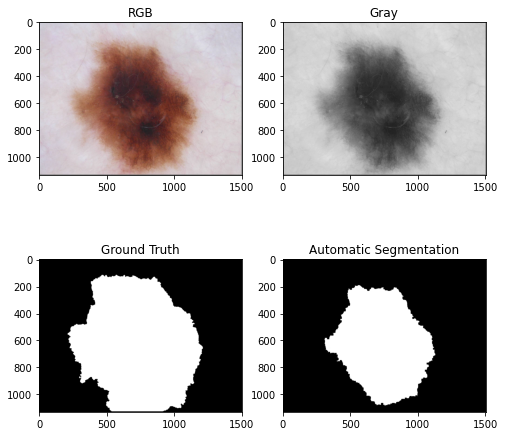

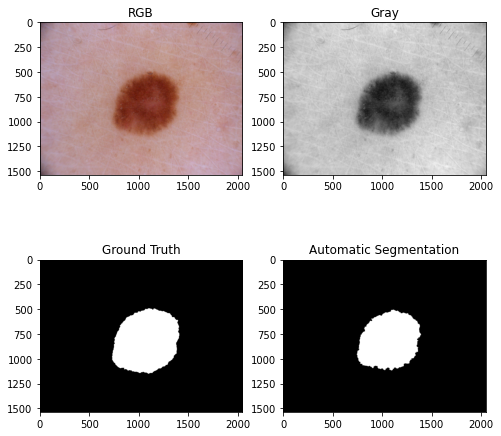

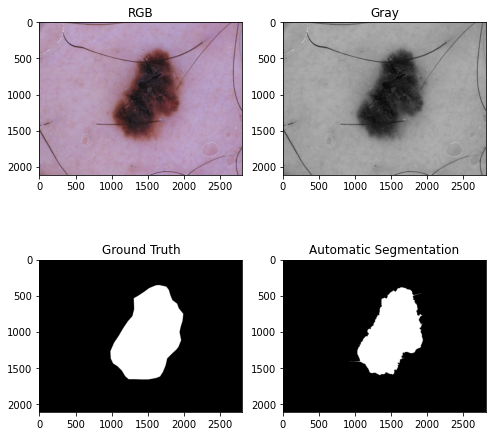

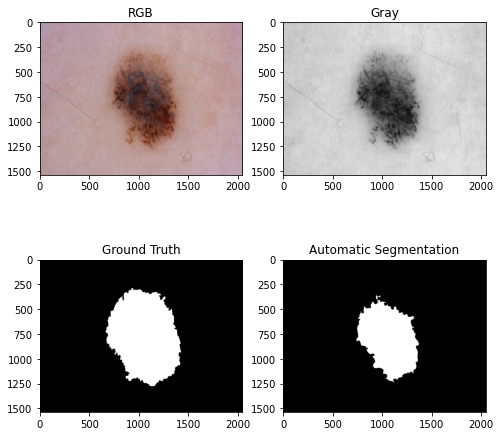

In [106]:
for ind,d in enumerate(data):
    plt.figure(figsize=(8,8))
    
    plt.subplot(221)
    plt.imshow(d[0])
    plt.title('RGB')
    
    plt.subplot(222)
    plt.imshow(d[1],'gray')
    plt.title('Gray')
    
    plt.subplot(223)
    plt.imshow(d[2],'gray')
    plt.title('Ground Truth')
    
    plt.subplot(224)
    plt.imshow(detectLesionRegion(d[1]),'gray')
    plt.title('Automatic Segmentation')
    

## Task 2: Segmentation Evaluation

/tmp/ipykernel_248906/3947683311.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,8))


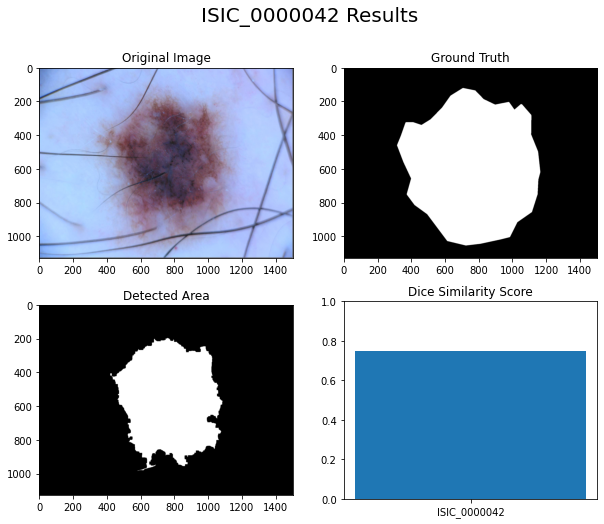

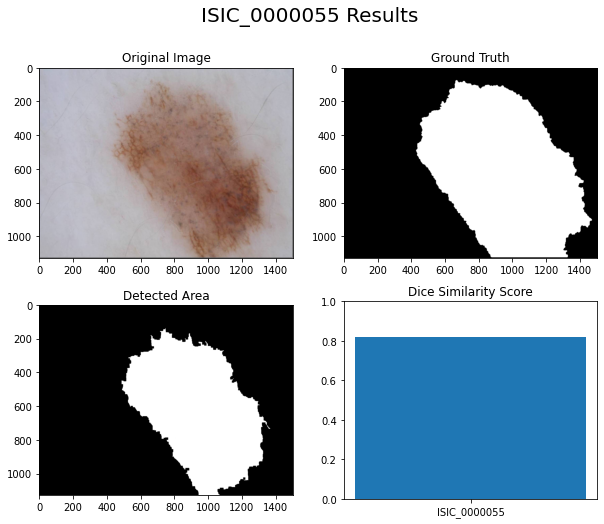

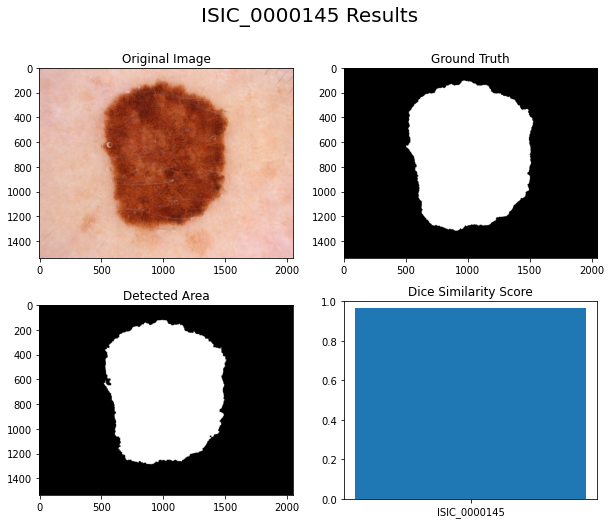

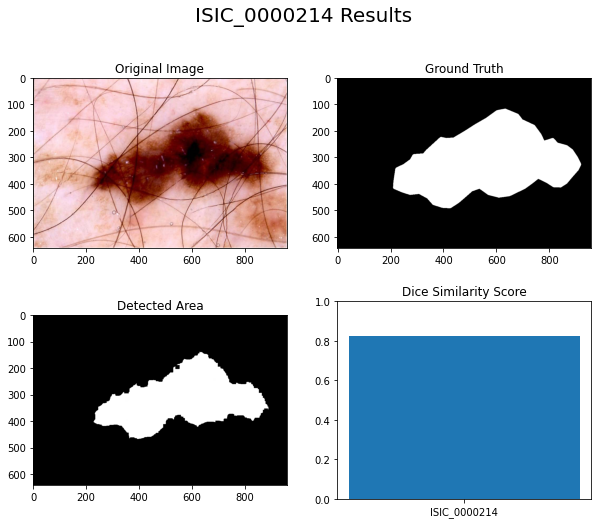

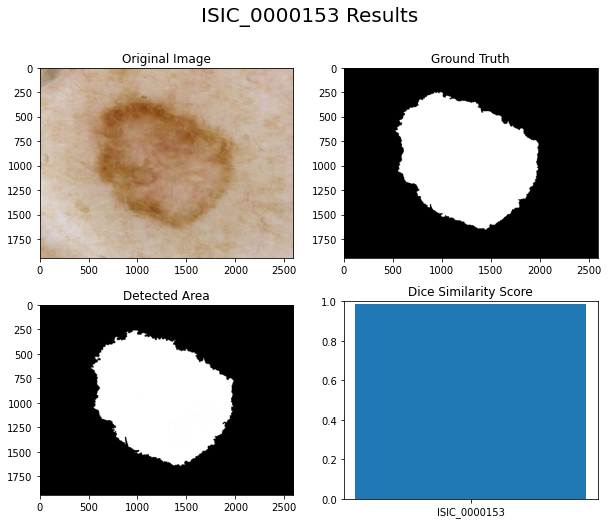

...

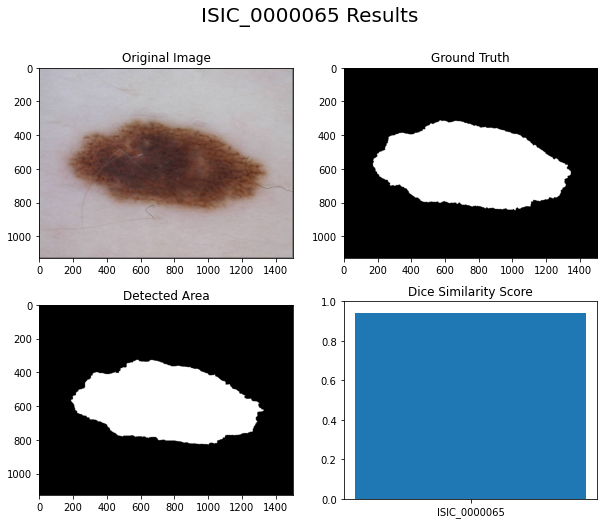

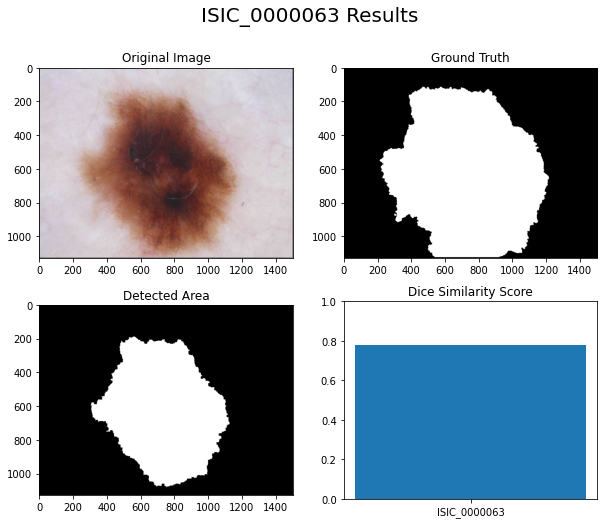

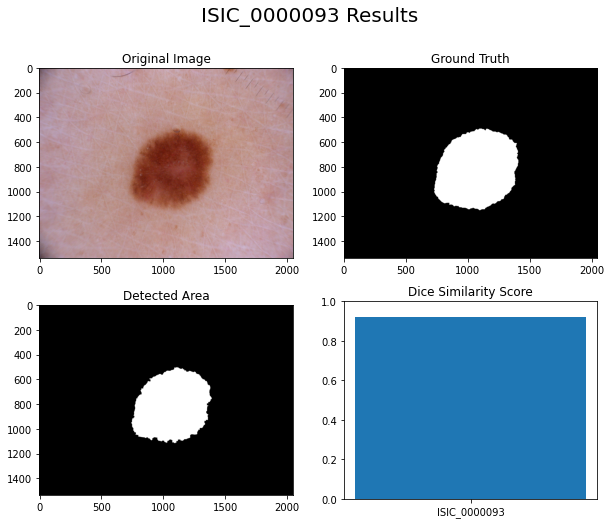

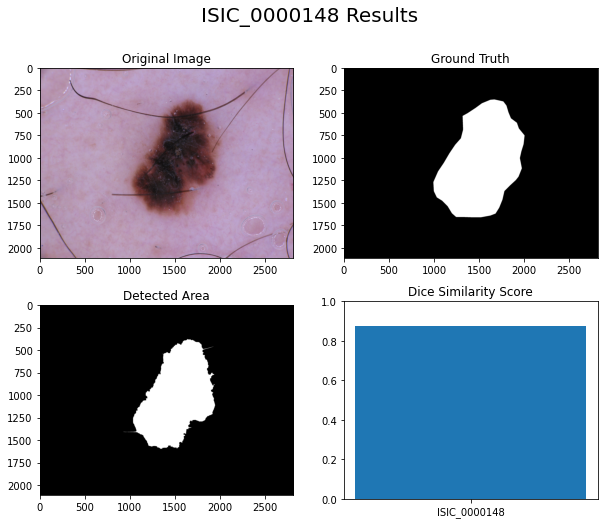

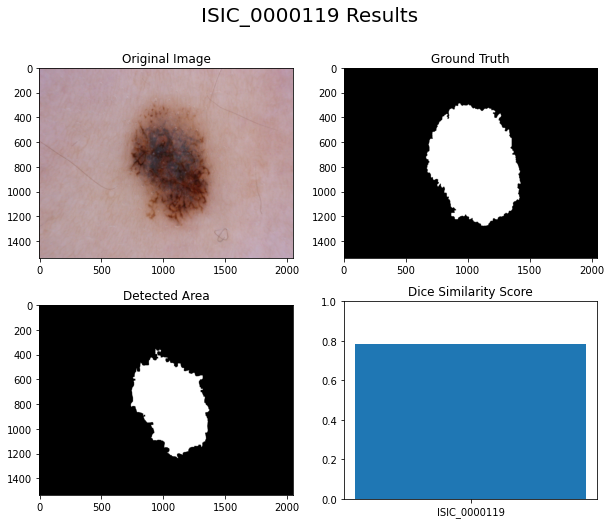

In [129]:
for i,d in enumerate(data):
    gray_img = d[1]
    rgb_img = d[0]
    ground_truth = d[2]
    img_name = d[3]
    auto_segmentation = detectLesionRegion(gray_img)
    
    M_inter_S = cv2.bitwise_and(ground_truth,auto_segmentation)
    M_inter_S_area = len(M_inter_S[M_inter_S > 0])
    
    M = len(auto_segmentation[auto_segmentation > 0])
    S = len(ground_truth[ground_truth > 0])
    
    DS = (2*M_inter_S_area)/(M+S)

    plt.figure(figsize=(10,8))
    plt.suptitle(f"{img_name} Results",fontsize=20)
    
    plt.subplot(221)
    plt.imshow(rgb_img)
    plt.title('Original Image')
    
    plt.subplot(222)
    plt.imshow(ground_truth,'gray')
    plt.title('Ground Truth')
    
    plt.subplot(223)
    plt.imshow(auto_segmentation,'gray')
    plt.title('Detected Area')
    
    plt.subplot(224)
    x_axis = [img_name]
    y_axis = [DS]
    plt.bar(x_axis,y_axis)
    plt.ylim(top=1,bottom=0)
    plt.title('Dice Similarity Score')
    
    data[i] = [d[0],d[1],d[2],d[3],DS]

/tmp/ipykernel_248906/2322721635.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  tdata = np.array(data)


Text(0.5, 1.0, 'Dice Similarity Score')

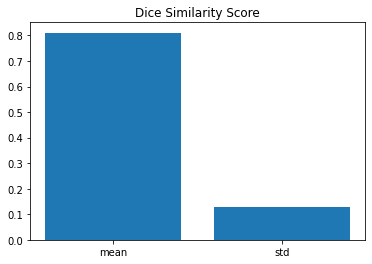

In [134]:
tdata = np.array(data)
all_DS = np.array(tdata[:,4])
x_axis = ["mean","std"]
y_axis = [np.mean(all_DS),np.std(all_DS)]
plt.bar(x_axis,y_axis)
plt.title('Dice Similarity Score')

# Task 2: Feature Calculation

In [2]:
org_img = cv2.imread('IMGPia.jpeg')
rgb_img = cv2.cvtColor(org_img,cv2.COLOR_BGR2RGB)
gray_img = cv2.cvtColor(org_img, cv2.COLOR_BGR2GRAY)

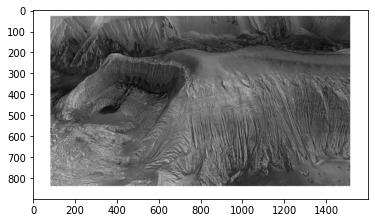

In [3]:
plt.imshow(gray_img,'gray')

## Task 1

In [4]:
def frequencyDomainOps(tg_img,R=0,D=0,op='low_pass'):
    fft_img = np.fft.fft2(tg_img)
    shifted_fft_img = np.fft.fftshift(fft_img)
    mask = np.zeros_like(tg_img)
    
    rows, cols = tg_img.shape
    cy,cx = rows//2 , cols//2
    
    if op == 'low_pass':
        cv2.circle(mask,(cx,cy),R,(255,255,255),-1)
    else:
        cv2.circle(mask,(cx,cy),D,(255,255,255),-1)
        mask = 255-mask
    blurred_mask = cv2.GaussianBlur(mask,(15,15),0)
    
    fft_shift_maked = np.multiply(shifted_fft_img,mask)/255
    fft_shift_blurred_masked = np.multiply(shifted_fft_img,blurred_mask)/255
    
    ishift_masked = np.fft.ifftshift(fft_shift_maked)
    ishift_blurred_masked = np.fft.ifftshift(fft_shift_blurred_masked)
    
    ifft_masked = np.fft.ifft2(ishift_masked)
    ifft_blurred_masked = np.fft.ifft2(ishift_blurred_masked)
    
    return (fft_img,shifted_fft_img,mask,blurred_mask,ifft_masked,ifft_blurred_masked)

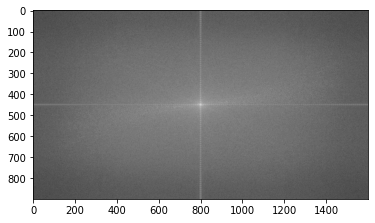

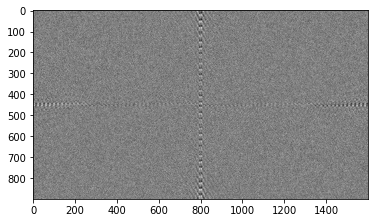

In [5]:
fft_img,shifted_fft_img,mask,blurred_mask,ifft_masked,ifft_blurred_masked =frequencyDomainOps(gray_img,R=30,op='low_pass')
plt.imshow(np.log(np.abs(shifted_fft_img))/20,'gray')
plt.show()
phase_spectrum = np.angle(shifted_fft_img)
plt.imshow(phase_spectrum,'gray')

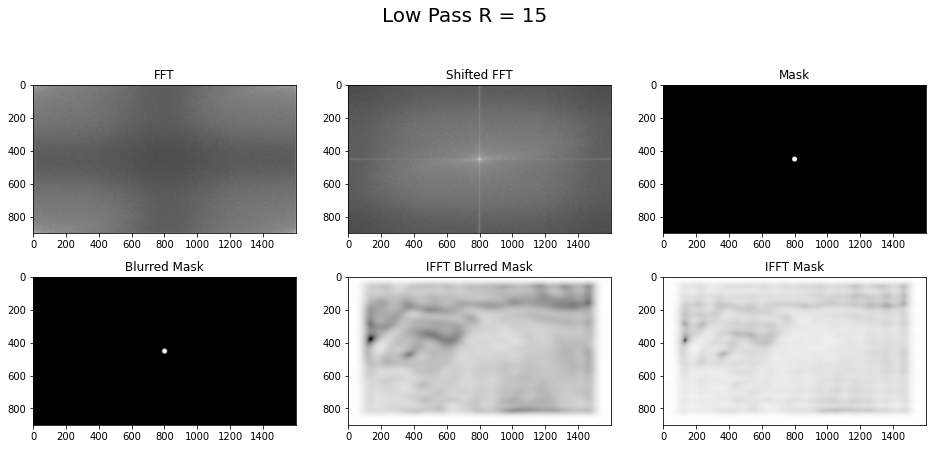

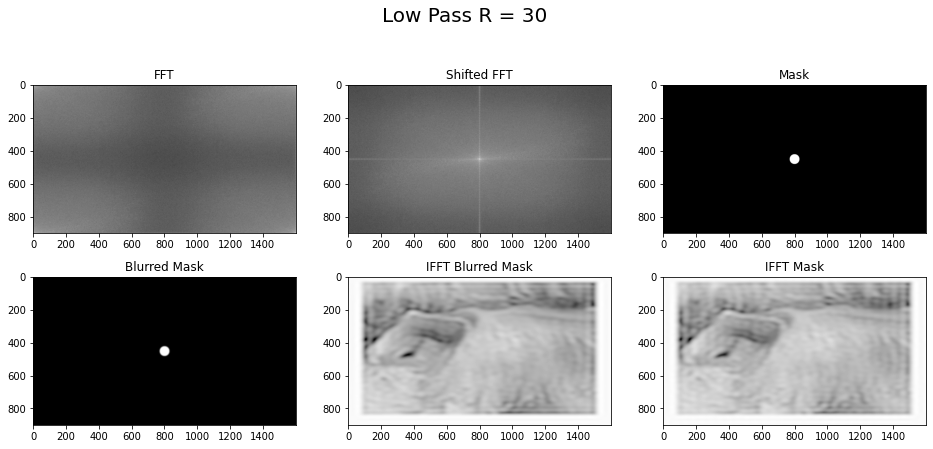

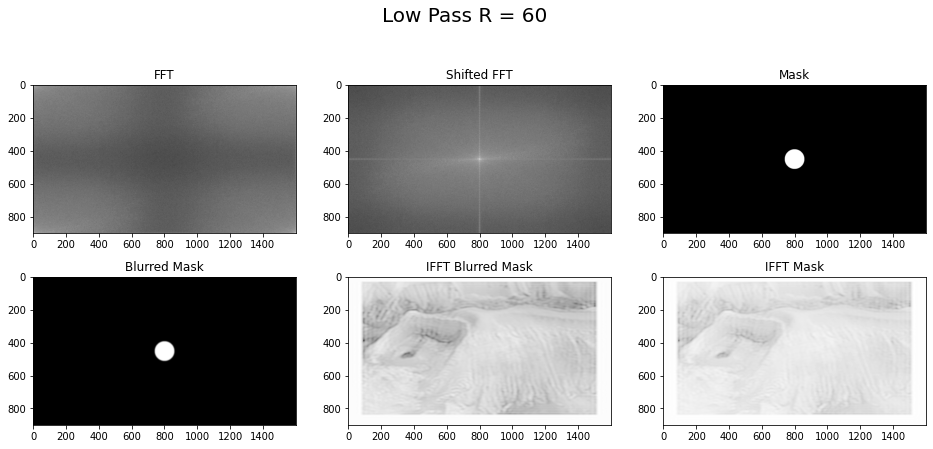

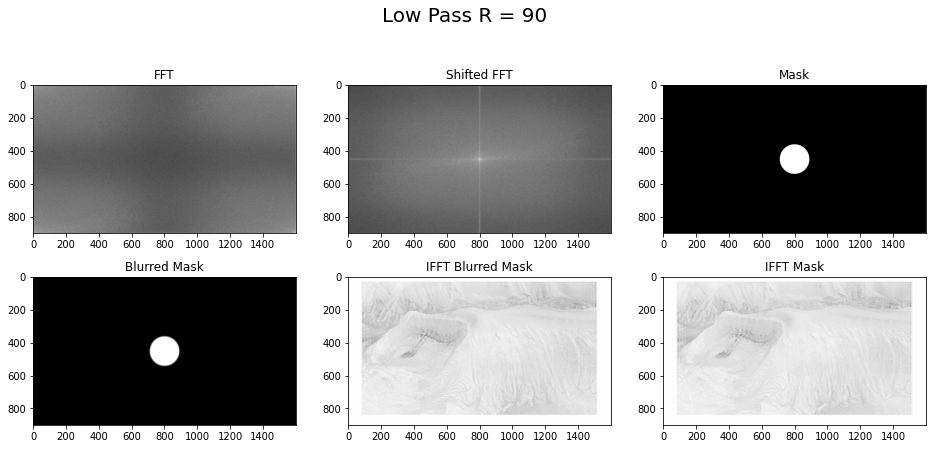

In [6]:
Rs = [15,30,60,90]
for R in Rs:
    fft_img,shifted_fft_img,mask,blurred_mask,ifft_masked,ifft_blurred_masked =frequencyDomainOps(gray_img,R=R,op='low_pass'
                                                                                                )
    plt.figure(figsize=(16,10))
    plt.suptitle(f'Low Pass R = {R}', size= 20)
    plt.subplot(331)
    plt.imshow(np.log(np.abs(fft_img))/20,'gray')
    plt.title('FFT')

    plt.subplot(332)
    plt.imshow(np.log(np.abs(shifted_fft_img))/20,'gray')
    plt.title('Shifted FFT')

    plt.subplot(333)
    plt.imshow(mask,'gray')
    plt.title('Mask')

    plt.subplot(334)
    plt.imshow(blurred_mask,'gray')
    plt.title('Blurred Mask')

    plt.subplot(335)
    plt.imshow(np.log(np.abs(ifft_blurred_masked))/20,'gray')
    plt.title('IFFT Blurred Mask')


    plt.subplot(336)
    plt.imshow(np.log(np.abs(ifft_masked))/20,'gray')
    plt.title('IFFT Mask')

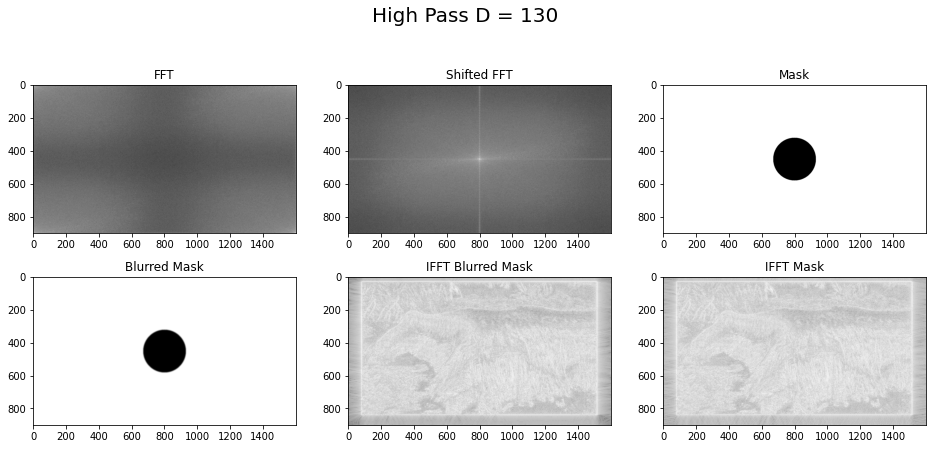

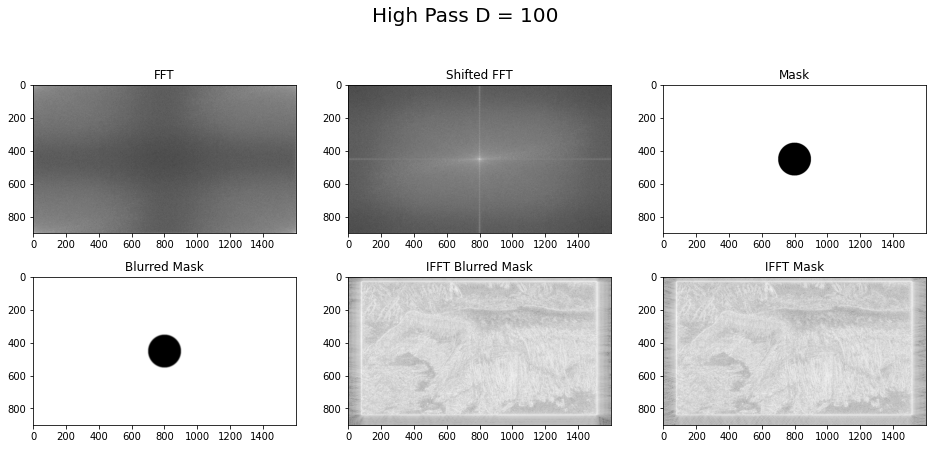

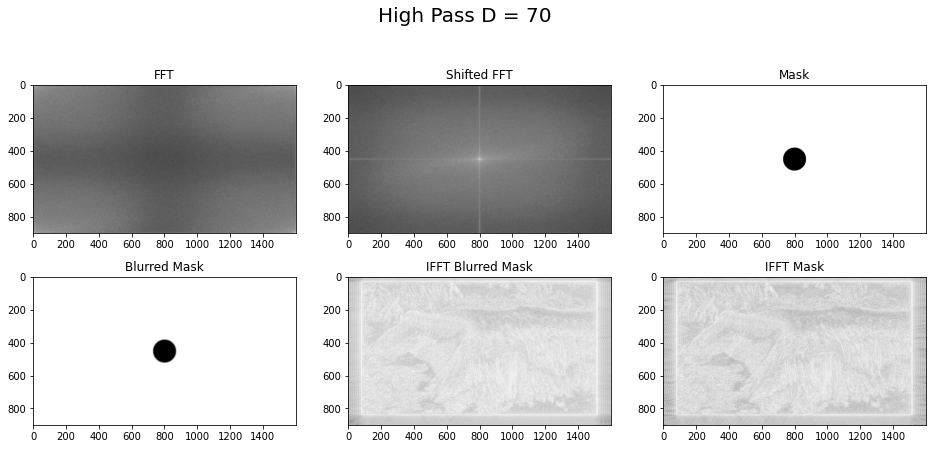

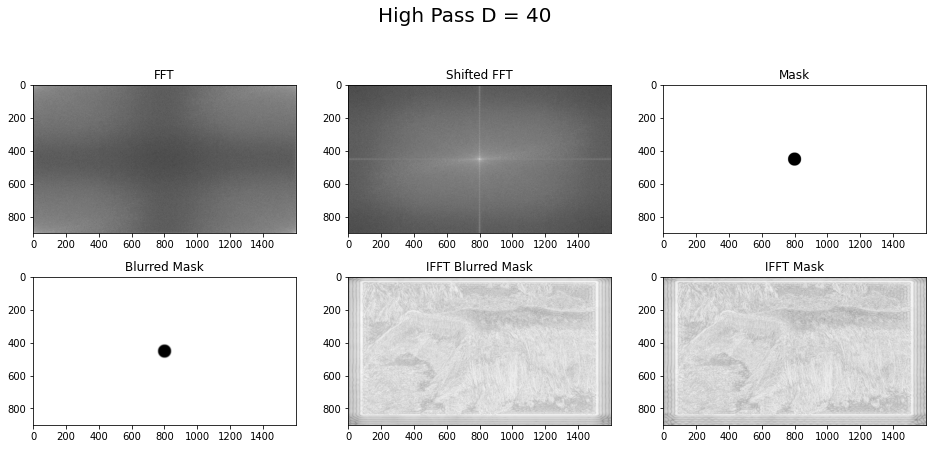

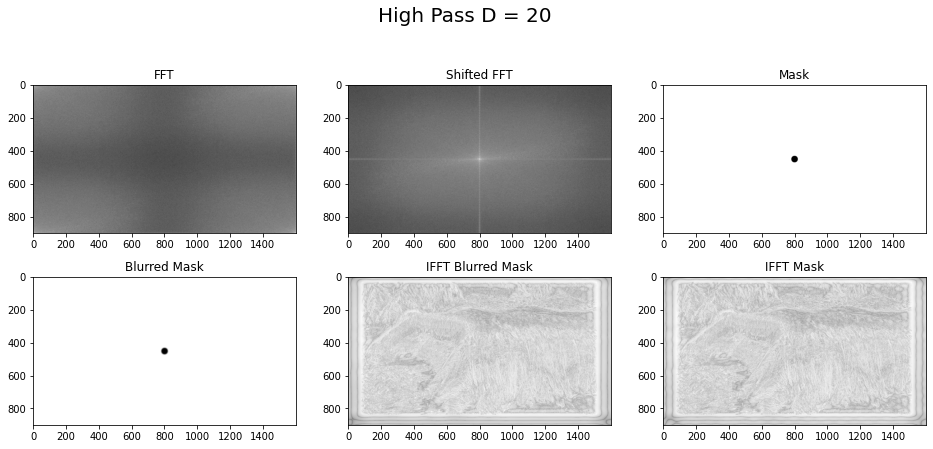

In [7]:
Ds = [130,100,70,40,20]
for D in Ds:
    fft_img,shifted_fft_img,mask,blurred_mask,ifft_masked,ifft_blurred_masked =frequencyDomainOps(gray_img,D=D,op='high_pass'
                                                                                                )
    plt.figure(figsize=(16,10))
    plt.suptitle(f'High Pass D = {D}', size= 20)
    plt.subplot(331)
    plt.imshow(np.log(np.abs(fft_img))/20,'gray')
    plt.title('FFT')

    plt.subplot(332)
    plt.imshow(np.log(np.abs(shifted_fft_img))/20,'gray')
    plt.title('Shifted FFT')

    plt.subplot(333)
    plt.imshow(mask,'gray')
    plt.title('Mask')

    plt.subplot(334)
    plt.imshow(blurred_mask,'gray')
    plt.title('Blurred Mask')

    plt.subplot(335)
    plt.imshow(np.log(np.abs(ifft_blurred_masked))/20,'gray')
    plt.title('IFFT Blurred Mask')


    plt.subplot(336)
    plt.imshow(np.log(np.abs(ifft_masked))/20,'gray')
    plt.title('IFFT Mask')

## Task 2

In [8]:
from pyfeats import histogram, glrlm_features, glcm_features
mask = np.ones_like(gray_img)

Text(0.5, 0, 'Bin No #')

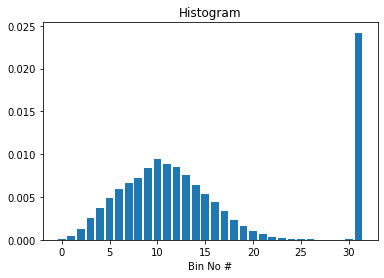

In [10]:
H, labels = histogram(gray_img,mask, bins=32)
labels = list(np.arange(len(labels)))
plt.bar(labels,H)
plt.title('Histogram')
plt.xlabel('Bin No #')

### Gray Level Run Length Matrix

In [11]:
features, labels = glrlm_features(gray_img, mask, Ng=256)
for i in range(len(labels)):
    print(f"{labels[i]} = {features[i]}")

GLRLM_ShortRunEmphasis = 0.9558764640944488
GLRLM_LongRunEmphasis = 78.30850816894302
GLRLM_GrayLevelNo-Uniformity = 8646.984825551068
GLRLM_RunLengthNonUniformity = 999727.4627246503
GLRLM_RunPercentage = 2.745056985294118
GLRLM_LowGrayLevelRunEmphasis = 424210774503.4302
GLRLM_HighGrayLevelRunEmphasis = 10011.68008646501
GLRLM_Short owGrayLevelEmphasis = 424210774503.4302
GLRLM_ShortRunHighGrayLevelEmphasis = 9315.502436187046
GLRLM_LongRunLowGrayLevelEmphasis = 1.0
GLRLM_LongRunHighGrayLevelEmphasis = 4987196.353763193


### Gray Level Co-occurence Matrix

In [12]:
features_mean, features_range, labels_mean, labels_range = glcm_features(gray_img, ignore_zeros=True)
for i in range(len(labels_mean)):
    print(f"{labels_mean[i]} = {features_mean[i]}")

GLCM_ASM_Mean = 0.03112616747755554
GLCM_Contrast_Mean = 255.22329672121003
GLCM_Correlation_Mean = 0.9757518702198942
GLCM_SumOfSquaresVariance_Mean = 5264.016855606467
GLCM_InverseDifferenceMoment_Mean = 0.29750452051135606
GLCM_SumAverage_Mean = 241.5257927291878
GLCM_SumVariance_Mean = 20800.84412570465
GLCM_SumEntropy_Mean = 7.396549944457927
GLCM_Entropy_Mean = 11.291601493216028
GLCM_DifferenceVariance_Mean = 0.0003048268580715122
GLCM_DifferenceEntropy_Mean = 4.52324160156434
GLCM_Information1_Mean = -0.2839672974328937
GLCM_Information2_Mean = 0.987354118206135
GLCM_MaximalCorrelationCoefficient_Mean = 6.003516629712622


In [13]:
for i in range(len(labels_range)):
    print(f"{labels_range[i]} = {features_range[i]}")

GLCM_ASM_Range = 0.0008232417729972276
GLCM_Contrast_Range = 183.4511235033232
GLCM_Correlation_Range = 0.017467272347093887
GLCM_SumOfSquaresVariance_Range = 14.147564181228518
GLCM_InverseDifferenceMoment_Range = 0.03414274990399835
GLCM_SumAverage_Range = 0.29872176898919633
GLCM_SumVariance_Range = 215.08706325096864
GLCM_SumEntropy_Range = 0.015012902484778934
GLCM_Entropy_Range = 0.43030395542736244
GLCM_DifferenceVariance_Range = 6.751720926339433e-05
GLCM_DifferenceEntropy_Range = 0.47271449246710606
GLCM_Information1_Range = 0.06471643876793426
GLCM_Information2_Range = 0.010166886160284827
GLCM_MaximalCorrelationCoefficient_Range = 0.6376573540205612


# Task 3: Object Tracking

In [14]:
def readFile(csv):
    f = open(csv,'r')
    text = f.read()
    text = text.replace('\n','')
    temp = text.split(',')
    temp = list(map(float,temp))
    return temp

In [15]:
a = readFile('a.csv')
b = readFile('b.csv')

x = readFile('x.csv')
y = readFile('y.csv')

real_coords = np.c_[x,y]
noisy_coords = np.c_[a,b]

In [16]:
class KalmanFilter:
    kf = cv2.KalmanFilter(4, 2)
    dt = 0.1
    kf.measurementMatrix = np.array([[1, 0, 0, 0], [0, 1, 0, 0]], np.float32)
    kf.transitionMatrix = np.array([
        [1, 0, dt, 0],
        [0, 1, 0, dt],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ],np.float32)
    kf.measurementNoiseCov = np.array([
        [0.25, 0],
        [0, 0.25]
    ],np.float32)

    kf.processNoiseCov = np.array([
        [0.16, 0, 0, 0],
        [0, 0.36, 0, 0],
        [0, 0, 0.16, 0],
        [0, 0, 0, 0.36],
    ],np.float32)
    

    def predict(self, coordX, coordY):
        measured = np.array([[np.float32(coordX)], [np.float32(coordY)]])
        self.kf.correct(measured)
        predicted = self.kf.predict()
        return [predicted[0][0], predicted[1][0]]

## Task 1

In [17]:
kf = KalmanFilter()
predictions = []
for pt in noisy_coords:
    predicted = kf.predict(pt[0], pt[1])
    predictions.append(predicted)
predictions = np.array(predictions)

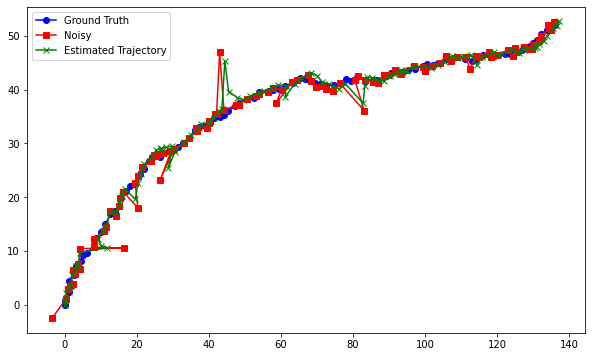

In [18]:
a_,b_ = (predictions[:,0],predictions[:,1])
plt.figure(figsize=(10,6))
plt.plot(x,y,"-b",marker="o",label="Ground Truth")
plt.plot(a,b,"-r",marker="s",label="Noisy")
plt.plot(a_,b_,"-g",marker="x",label="Estimated Trajectory")
plt.legend(loc = "upper left")

## Task 2

In [19]:
est_absolute_error = [0]*len(noisy_coords)
noisy_absolute_error = [0]*len(noisy_coords)

for i,v in enumerate(est_absolute_error):
    est_absolute_error[i] = [abs(predictions[i][0]-real_coords[i][0]),abs(predictions[i][1]-real_coords[i][1])]
    noisy_absolute_error[i] = [abs(noisy_coords[i][0]-real_coords[i][0]),abs(noisy_coords[i][1]-real_coords[i][1])]

In [20]:
N = len(noisy_coords)
est_rms_error = [0]*N
noisy_rms_error = [0]*N

for i,v in enumerate(est_rms_error):
    est_rms_error[i] = [((predictions[i][0]-real_coords[i][0])**2)/N,((predictions[i][1]-real_coords[i][1])**2)/N]
    noisy_rms_error[i] = [((noisy_coords[i][0]-real_coords[i][0])**2)/N,((noisy_coords[i][1]-real_coords[i][1])**2/N)]

In [21]:
mean_noisy_abs_error,std_noisy_abs_error,mean_noisy_rms_error,std_noisy_rms_error = (
    np.average(np.mean(noisy_absolute_error,axis=0)),np.average(np.std(noisy_absolute_error,axis=0)),
    np.average(np.mean(noisy_rms_error,axis=0)),np.average(np.std(noisy_rms_error,axis=0))
)

mean_est_abs_error,std_est_abs_error,mean_est_rms_error,std_est_rms_error = (
    np.average(np.mean(est_absolute_error,axis=0)),np.average(np.std(est_absolute_error,axis=0)),
    np.average(np.mean(est_rms_error,axis=0)),np.average(np.std(est_rms_error,axis=0))
)


Text(0.5, 1.0, 'Mean')

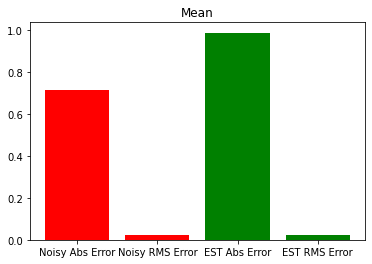

In [22]:
x_axis_mean1 = ['Noisy Abs Error','Noisy RMS Error']
y_axis_mean1 = [mean_noisy_abs_error,mean_noisy_rms_error]
plt.bar(x_axis_mean1,y_axis_mean1, color="r")

x_axis_mean2 = ['EST Abs Error','EST RMS Error']
y_axis_mean2 = [mean_est_abs_error,mean_est_rms_error]
plt.bar(x_axis_mean2,y_axis_mean2,color="g")
plt.title('Mean')

Text(0.5, 1.0, 'Standard Deviation')

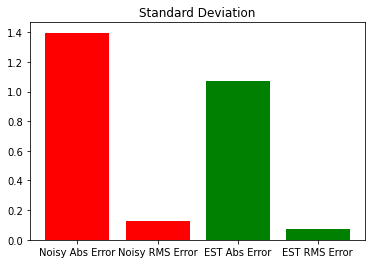

In [23]:
x_axis_std1 = ['Noisy Abs Error','Noisy RMS Error']
y_axis_std1 = [std_noisy_abs_error,std_noisy_rms_error]
plt.bar(x_axis_std1,y_axis_std1, color="r")

x_axis_std2 = ['EST Abs Error','EST RMS Error']
y_axis_std2 = [std_est_abs_error,std_est_rms_error]
plt.bar(x_axis_std2,y_axis_std2,color="g")
plt.title('Standard Deviation')